In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import feature_column
from tensorflow.keras import layers
from matplotlib import pyplot as plt

# The following lines adjust the granularity of reporting.
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format
# tf.keras.backend.set_floatx('float32')

In [2]:
train = pd.read_csv(filepath_or_buffer="train.csv")
train.columns = train.columns.str.replace(' ', '')
corr_features = train[['X', 'Y', 'target_2015', 'elevation']].copy()
train.describe()

,X,Y,target_2015,elevation,precip2014-11-16-2014-11-23,precip2014-11-23-2014-11-30,precip2014-11-30-2014-12-07,precip2014-12-07-2014-12-14,precip2014-12-14-2014-12-21,precip2014-12-21-2014-12-28,...,precip2019-03-17-2019-03-24,precip2019-03-24-2019-03-31,precip2019-03-31-2019-04-07,precip2019-04-07-2019-04-14,precip2019-04-14-2019-04-21,precip2019-04-21-2019-04-28,precip2019-04-28-2019-05-05,precip2019-05-05-2019-05-12,precip2019-05-12-2019-05-19,LC_Type1_mode
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,...,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,35.1,-15.8,0.1,592.8,1.6,2.5,1.2,8.3,8.9,9.6,...,35.6,2.1,3.5,3.6,9.1,1.7,0.5,1.0,1.6,10.7
std,0.4,0.4,0.2,354.8,4.2,8.6,4.4,4.3,3.8,4.5,...,14.5,3.7,8.0,3.8,6.9,4.4,1.5,3.7,4.7,2.0
min,34.3,-16.6,0.0,45.5,0.0,0.0,0.0,1.4,3.6,1.3,...,15.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
25%,34.8,-16.1,0.0,329.1,0.0,0.0,0.0,5.5,5.9,6.2,...,22.0,0.0,0.0,0.0,4.4,0.0,0.0,0.0,0.0,9.0
50%,35.0,-15.8,0.0,623.0,0.0,0.0,0.0,7.9,8.6,8.8,...,34.3,0.9,0.0,2.6,7.9,0.0,0.0,0.0,0.0,10.0
75%,35.4,-15.5,0.0,751.4,1.3,0.0,0.0,10.9,11.0,12.7,...,44.3,2.1,2.9,6.4,13.5,0.0,0.0,0.0,0.0,12.0
max,35.9,-15.2,1.0,2803.3,19.4,41.0,22.0,18.9,23.0,21.8,...,72.1,16.4,37.1,13.0,46.4,19.5,6.9,18.2,20.1,17.0


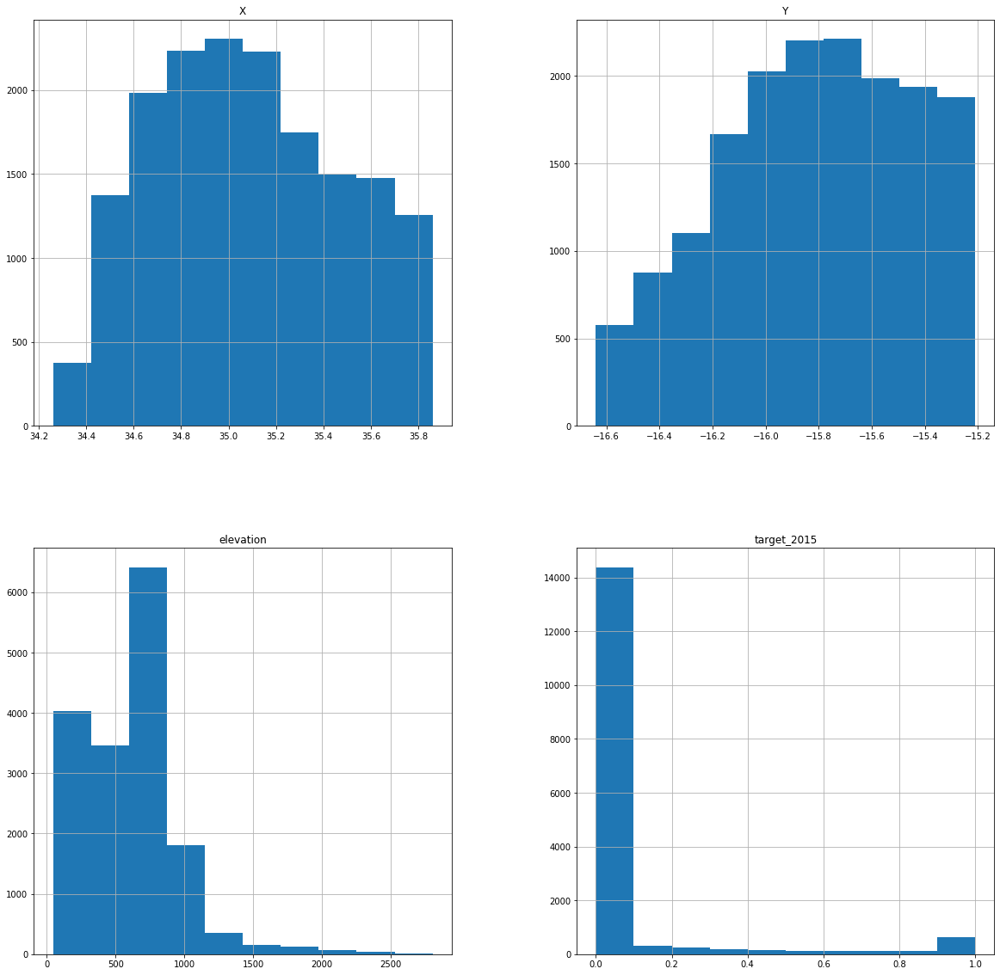

In [3]:
hist = corr_features.hist(figsize=(20, 20))

In [4]:
corr_features.corr()

,X,Y,target_2015,elevation
X,1.0,0.2,0.1,0.4
Y,0.2,1.0,-0.1,0.5
target_2015,0.1,-0.1,1.0,-0.2
elevation,0.4,0.5,-0.2,1.0


In [5]:
train.head()

,X,Y,target_2015,elevation,precip2014-11-16-2014-11-23,precip2014-11-23-2014-11-30,precip2014-11-30-2014-12-07,precip2014-12-07-2014-12-14,precip2014-12-14-2014-12-21,precip2014-12-21-2014-12-28,...,precip2019-03-24-2019-03-31,precip2019-03-31-2019-04-07,precip2019-04-07-2019-04-14,precip2019-04-14-2019-04-21,precip2019-04-21-2019-04-28,precip2019-04-28-2019-05-05,precip2019-05-05-2019-05-12,precip2019-05-12-2019-05-19,LC_Type1_mode,Square_ID
0,34.3,-15.9,0.0,887.8,0.0,0.0,0.0,14.8,14.6,12.2,...,0.9,1.7,0.0,0.0,0.0,0.0,0.0,0.0,9,4e3c3896-14ce-11ea-bce5-f49634744a41
1,34.3,-15.9,0.0,743.4,0.0,0.0,0.0,14.8,14.6,12.2,...,0.9,1.7,0.0,0.0,0.0,0.0,0.0,0.0,9,4e3c3897-14ce-11ea-bce5-f49634744a41
2,34.3,-15.9,0.0,565.7,0.0,0.0,0.0,14.8,14.6,12.2,...,0.9,1.7,0.0,0.0,0.0,0.0,0.0,0.0,9,4e3c3898-14ce-11ea-bce5-f49634744a41
3,34.3,-15.9,0.0,443.4,0.0,0.0,0.0,14.8,14.6,12.2,...,0.9,1.7,0.0,0.0,0.0,0.0,0.0,0.0,10,4e3c3899-14ce-11ea-bce5-f49634744a41
4,34.3,-15.9,0.0,437.4,0.0,0.0,0.0,14.8,14.6,12.2,...,0.9,1.7,0.0,0.0,0.0,0.0,0.0,0.0,10,4e3c389a-14ce-11ea-bce5-f49634744a41


In [6]:
## LC_Type1_mode

# 1	05450a	Evergreen Needleleaf Forests: dominated by evergreen conifer trees (canopy >2m). Tree cover >60%.
# 2	086a10	Evergreen Broadleaf Forests: dominated by evergreen broadleaf and palmate trees (canopy >2m). Tree cover >60%.
# 3	54a708	Deciduous Needleleaf Forests: dominated by deciduous needleleaf (larch) trees (canopy >2m). Tree cover >60%.
# 4	78d203	Deciduous Broadleaf Forests: dominated by deciduous broadleaf trees (canopy >2m). Tree cover >60%.
# 5	009900	Mixed Forests: dominated by neither deciduous nor evergreen (40-60% of each) tree type (canopy >2m). Tree cover >60%.
# 6	c6b044	Closed Shrublands: dominated by woody perennials (1-2m height) >60% cover.
# 7	dcd159	Open Shrublands: dominated by woody perennials (1-2m height) 10-60% cover.
# 8	dade48	Woody Savannas: tree cover 30-60% (canopy >2m).
# 9	fbff13	Savannas: tree cover 10-30% (canopy >2m).
# 10	b6ff05	Grasslands: dominated by herbaceous annuals (<2m).
# 11	27ff87	Permanent Wetlands: permanently inundated lands with 30-60% water cover and >10% vegetated cover.
# 12	c24f44	Croplands: at least 60% of area is cultivated cropland.
# 13	a5a5a5	Urban and Built-up Lands: at least 30% impervious surface area including building materials, asphalt and vehicles.
# 14	ff6d4c	Cropland/Natural Vegetation Mosaics: mosaics of small-scale cultivation 40-60% with natural tree, shrub, or herbaceous vegetation.
# 15	69fff8	Permanent Snow and Ice: at least 60% of area is covered by snow and ice for at least 10 months of the year.
# 16	f9ffa4	Barren: at least 60% of area is non-vegetated barren (sand, rock, soil) areas with less than 10% vegetation.
# 17	1c0dff	Water Bodies: at least 60% of area is covered by permanent water bodies.

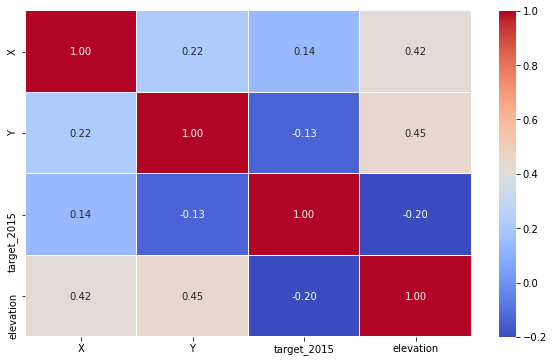

In [7]:
f, ax = plt.subplots(figsize=(10,6))
corr= corr_features.corr()
heatmap = sns.heatmap(round(corr, 2), annot=True, ax=ax, cmap='coolwarm',fmt='.2f',linewidths=.05)

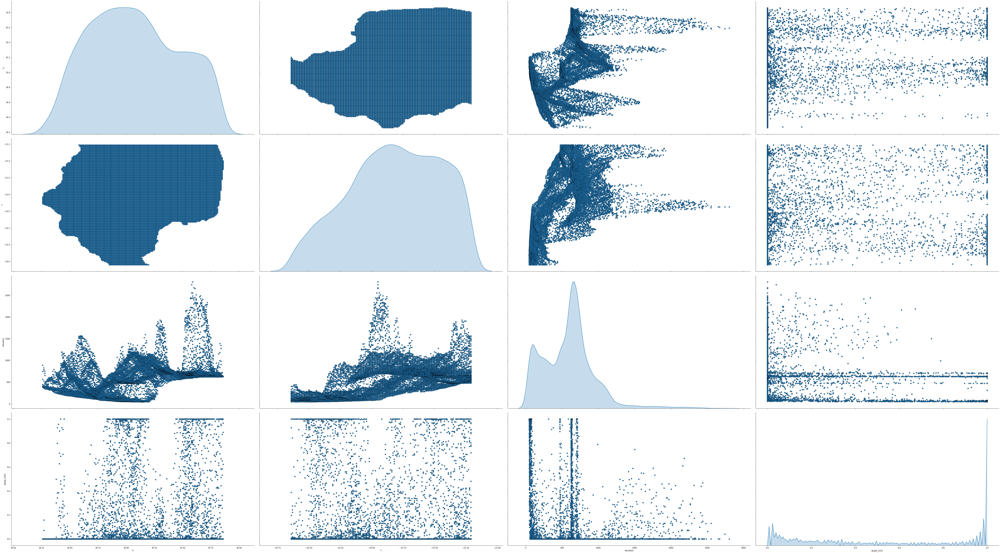

In [8]:
# Pair-wise Scatter Plots
cols = ['X', 'Y', 'elevation', 'target_2015']
pp = sns.pairplot(train[cols], height=10, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

In [9]:
# cross 'X' and 'Y'
train['XY'] = train['X']*train['Y']
train["XY_elevation"] = train['XY'] * train['elevation']
train.describe()

,X,Y,target_2015,elevation,precip2014-11-16-2014-11-23,precip2014-11-23-2014-11-30,precip2014-11-30-2014-12-07,precip2014-12-07-2014-12-14,precip2014-12-14-2014-12-21,precip2014-12-21-2014-12-28,...,precip2019-03-31-2019-04-07,precip2019-04-07-2019-04-14,precip2019-04-14-2019-04-21,precip2019-04-21-2019-04-28,precip2019-04-28-2019-05-05,precip2019-05-05-2019-05-12,precip2019-05-12-2019-05-19,LC_Type1_mode,XY,XY_elevation
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,...,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,35.1,-15.8,0.1,592.8,1.6,2.5,1.2,8.3,8.9,9.6,...,3.5,3.6,9.1,1.7,0.5,1.0,1.6,10.7,-554.7,-327752.4
std,0.4,0.4,0.2,354.8,4.2,8.6,4.4,4.3,3.8,4.5,...,8.0,3.8,6.9,4.4,1.5,3.7,4.7,2.0,12.8,197226.3
min,34.3,-16.6,0.0,45.5,0.0,0.0,0.0,1.4,3.6,1.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,-585.7,-1591324.7
25%,34.8,-16.1,0.0,329.1,0.0,0.0,0.0,5.5,5.9,6.2,...,0.0,0.0,4.4,0.0,0.0,0.0,0.0,9.0,-564.7,-417132.0
50%,35.0,-15.8,0.0,623.0,0.0,0.0,0.0,7.9,8.6,8.8,...,0.0,2.6,7.9,0.0,0.0,0.0,0.0,10.0,-554.3,-341942.2
75%,35.4,-15.5,0.0,751.4,1.3,0.0,0.0,10.9,11.0,12.7,...,2.9,6.4,13.5,0.0,0.0,0.0,0.0,12.0,-544.6,-181173.2
max,35.9,-15.2,1.0,2803.3,19.4,41.0,22.0,18.9,23.0,21.8,...,37.1,13.0,46.4,19.5,6.9,18.2,20.1,17.0,-526.0,-26592.7


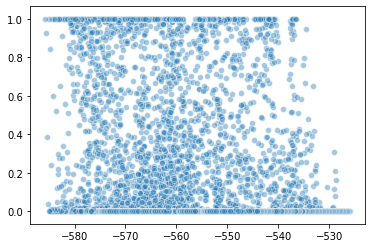

In [10]:
# Scatter Plot
plt.scatter(train['XY'], train['target_2015'], alpha=0.4, edgecolors='w')

In [11]:
train['total_precip_2015'] = 0
train['total_precip_2019'] = 0
count_2015=0
count_2019=0
for col in train.columns:
    if len(col) == 27:
        if col[9] == "5":
            count_2015 += 1
            train['total_precip_2015'] += train[col]
        elif  col[9] == "9":
            count_2019 += 1
            train['total_precip_2019'] += train[col]
        else:
            continue
    else:
        continue
train["ave_precip_2015"] = train['total_precip_2015'] / count_2015
train["ave_precip_2019"] = train['total_precip_2019'] / count_2019
train.describe()

,X,Y,target_2015,elevation,precip2014-11-16-2014-11-23,precip2014-11-23-2014-11-30,precip2014-11-30-2014-12-07,precip2014-12-07-2014-12-14,precip2014-12-14-2014-12-21,precip2014-12-21-2014-12-28,...,precip2019-04-28-2019-05-05,precip2019-05-05-2019-05-12,precip2019-05-12-2019-05-19,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,...,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,35.1,-15.8,0.1,592.8,1.6,2.5,1.2,8.3,8.9,9.6,...,0.5,1.0,1.6,10.7,-554.7,-327752.4,194.0,213.5,19.4,12.6
std,0.4,0.4,0.2,354.8,4.2,8.6,4.4,4.3,3.8,4.5,...,1.5,3.7,4.7,2.0,12.8,197226.3,23.7,27.2,2.4,1.6
min,34.3,-16.6,0.0,45.5,0.0,0.0,0.0,1.4,3.6,1.3,...,0.0,0.0,0.0,2.0,-585.7,-1591324.7,148.2,175.4,14.8,10.3
25%,34.8,-16.1,0.0,329.1,0.0,0.0,0.0,5.5,5.9,6.2,...,0.0,0.0,0.0,9.0,-564.7,-417132.0,179.3,199.3,17.9,11.7
50%,35.0,-15.8,0.0,623.0,0.0,0.0,0.0,7.9,8.6,8.8,...,0.0,0.0,0.0,10.0,-554.3,-341942.2,189.0,207.6,18.9,12.2
75%,35.4,-15.5,0.0,751.4,1.3,0.0,0.0,10.9,11.0,12.7,...,0.0,0.0,0.0,12.0,-544.6,-181173.2,206.7,220.6,20.7,13.0
max,35.9,-15.2,1.0,2803.3,19.4,41.0,22.0,18.9,23.0,21.8,...,6.9,18.2,20.1,17.0,-526.0,-26592.7,251.6,323.8,25.2,19.0


In [12]:
# Drop precip columns
# since we have computed total and average rainfall
for col in train.columns:
    if len(col) == 27:
        train = train.drop(columns=[col])
    else:
        continue
test = train.copy()

In [13]:
train.describe()

,X,Y,target_2015,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,35.1,-15.8,0.1,592.8,10.7,-554.7,-327752.4,194.0,213.5,19.4,12.6
std,0.4,0.4,0.2,354.8,2.0,12.8,197226.3,23.7,27.2,2.4,1.6
min,34.3,-16.6,0.0,45.5,2.0,-585.7,-1591324.7,148.2,175.4,14.8,10.3
25%,34.8,-16.1,0.0,329.1,9.0,-564.7,-417132.0,179.3,199.3,17.9,11.7
50%,35.0,-15.8,0.0,623.0,10.0,-554.3,-341942.2,189.0,207.6,18.9,12.2
75%,35.4,-15.5,0.0,751.4,12.0,-544.6,-181173.2,206.7,220.6,20.7,13.0
max,35.9,-15.2,1.0,2803.3,17.0,-526.0,-26592.7,251.6,323.8,25.2,19.0


In [14]:
test.describe()

,X,Y,target_2015,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,35.1,-15.8,0.1,592.8,10.7,-554.7,-327752.4,194.0,213.5,19.4,12.6
std,0.4,0.4,0.2,354.8,2.0,12.8,197226.3,23.7,27.2,2.4,1.6
min,34.3,-16.6,0.0,45.5,2.0,-585.7,-1591324.7,148.2,175.4,14.8,10.3
25%,34.8,-16.1,0.0,329.1,9.0,-564.7,-417132.0,179.3,199.3,17.9,11.7
50%,35.0,-15.8,0.0,623.0,10.0,-554.3,-341942.2,189.0,207.6,18.9,12.2
75%,35.4,-15.5,0.0,751.4,12.0,-544.6,-181173.2,206.7,220.6,20.7,13.0
max,35.9,-15.2,1.0,2803.3,17.0,-526.0,-26592.7,251.6,323.8,25.2,19.0


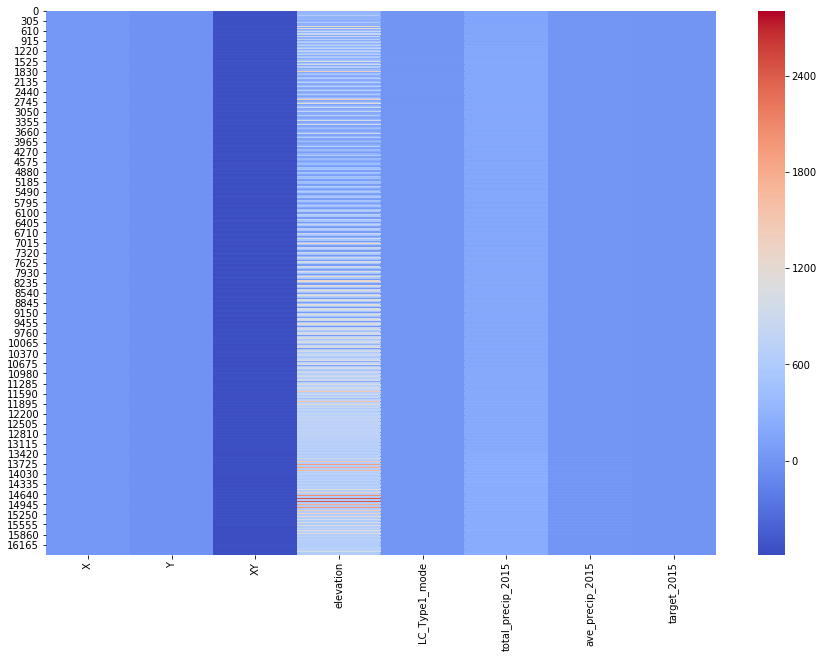

In [15]:
# Heat mat
cols = ['X', 'Y', 'XY', 'elevation', 'LC_Type1_mode', 'total_precip_2015', 'ave_precip_2015', 'target_2015']
f, ax = plt.subplots(figsize=(15,10))
corr= corr_features.corr()
heatmap = sns.heatmap(round(train[cols], 2), annot=False, ax=ax, cmap='coolwarm')

In [16]:
# # Pair-wise Scatter Plots
# pp = sns.pairplot(train[cols], height=5, aspect=1.8,
#                   plot_kws=dict(edgecolor="k", linewidth=0.5),
#                   diag_kind="kde", diag_kws=dict(shade=True))

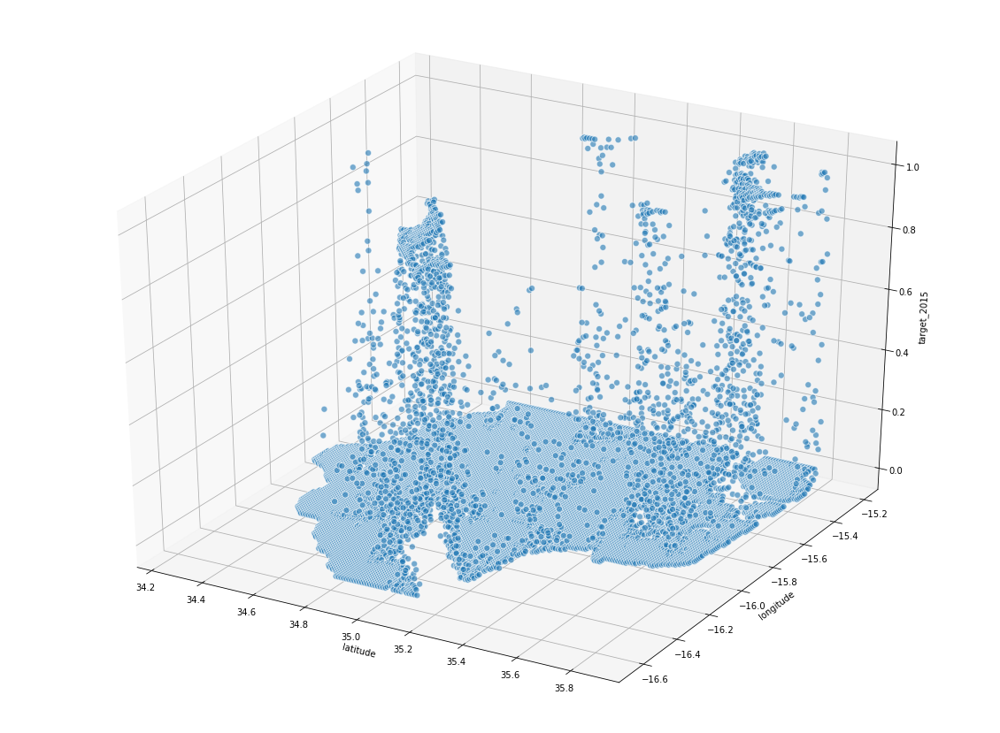

In [17]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

xs = train['X']
ys = train['Y']
zs = train['target_2015']
ax.scatter(xs, ys, zs, s=50, alpha=0.6, edgecolors='w')

ax.set_xlabel('latitude')
ax.set_ylabel('longitude')
ax.set_zlabel('target_2015')

plt.show()

Text(0.5, 1.05, 'Longitude - Latitude - Target_2015')

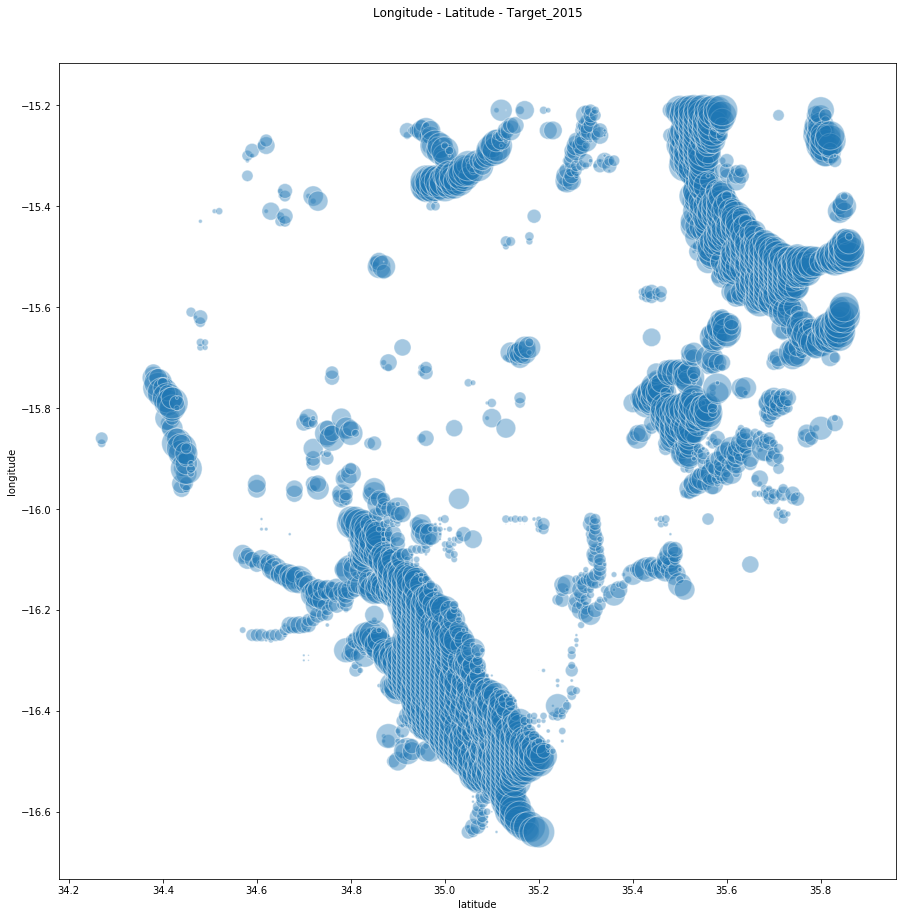

In [18]:
fig = plt.gcf()
fig.set_size_inches(15, 15)

plt.scatter(x = train['X'], 
            y = train['Y'], 
            s = train['target_2015']*1000, # <== 😀 Look here!
            alpha=0.4, 
            edgecolors='w')

plt.xlabel('latitude')
plt.ylabel('longitude')
plt.title('Longitude - Latitude - Target_2015', y=1.05)

In [61]:
import plotly.express as px
import plotly.graph_objects as go

fig = plt.gcf()
fig.set_size_inches(50, 50)

fig = px.scatter_3d(train, x='X', y='Y', z='elevation', color='target_2015', size_max=2)
fig.update_layout(title='Elevation', autosize=True,
                      width=500, height=500,
                      margin=dict(l=65, r=50, b=65, t=90))
fig.show()

# fig = go.Figure(data=[go.Scatter3d(x=train['X'], y=train['Y'], z=train['elevation'], color=train['target_2015'],
#                                    mode='markers')])
# fig.show()

# fig = go.Figure(data=[go.Surface(x=train['X'], y=train['Y'], z=train['elevation'],  surfacecolor=train['target_2015'])])
# fig.show()

<Figure size 3600x3600 with 0 Axes>

In [20]:
test = train.copy()

# Drop precip columns from train and test
for col in train.columns:
    if len(col) == 27:
        if col[9] == "5":
            train = train.drop(columns=[col])
        elif  col[9] == "9":
            test = test.drop(columns=[col])
        else:
            continue
    else:
        continue

In [21]:
train.head()

,X,Y,target_2015,elevation,LC_Type1_mode,Square_ID,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
0,34.3,-15.9,0.0,887.8,9,4e3c3896-14ce-11ea-bce5-f49634744a41,-545.1,-483899.5,153.5,182.2,15.3,10.7
1,34.3,-15.9,0.0,743.4,9,4e3c3897-14ce-11ea-bce5-f49634744a41,-544.7,-404957.4,153.5,182.2,15.3,10.7
2,34.3,-15.9,0.0,565.7,9,4e3c3898-14ce-11ea-bce5-f49634744a41,-544.4,-307977.6,153.5,182.2,15.3,10.7
3,34.3,-15.9,0.0,443.4,10,4e3c3899-14ce-11ea-bce5-f49634744a41,-544.0,-241227.3,153.5,182.2,15.3,10.7
4,34.3,-15.9,0.0,437.4,10,4e3c389a-14ce-11ea-bce5-f49634744a41,-543.7,-237840.7,153.5,182.2,15.3,10.7


In [22]:
train_unpivoted = train.melt(id_vars=['Square_ID'], value_vars=['total_precip_2015', 'total_precip_2019'], var_name='year', value_name='total_precip')
train_unpivoted

,Square_ID,year,total_precip
0,4e3c3896-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5
1,4e3c3897-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5
2,4e3c3898-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5
3,4e3c3899-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5
4,4e3c389a-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5
...,...,...,...
32927,4e6f5dfd-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1
32928,4e6f5dfe-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1
32929,4e6f5dff-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1
32930,4e6f5e00-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1


In [23]:
train_df = train_unpivoted.iloc[:16466]
test_df = train_unpivoted.iloc[16466:]
train_df = train_df.set_index('Square_ID').join(train.set_index('Square_ID')).reset_index()
train_df

,Square_ID,year,total_precip,X,Y,target_2015,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
0,4e3c3896-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5,34.3,-15.9,0.0,887.8,9,-545.1,-483899.5,153.5,182.2,15.3,10.7
1,4e3c3897-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5,34.3,-15.9,0.0,743.4,9,-544.7,-404957.4,153.5,182.2,15.3,10.7
2,4e3c3898-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5,34.3,-15.9,0.0,565.7,9,-544.4,-307977.6,153.5,182.2,15.3,10.7
3,4e3c3899-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5,34.3,-15.9,0.0,443.4,10,-544.0,-241227.3,153.5,182.2,15.3,10.7
4,4e3c389a-14ce-11ea-bce5-f49634744a41,total_precip_2015,153.5,34.3,-15.9,0.0,437.4,10,-543.7,-237840.7,153.5,182.2,15.3,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16461,4e6f5dfd-14ce-11ea-bce5-f49634744a41,total_precip_2015,228.5,35.9,-15.4,0.0,635.7,10,-553.7,-351959.5,228.5,277.1,22.9,16.3
16462,4e6f5dfe-14ce-11ea-bce5-f49634744a41,total_precip_2015,228.5,35.9,-15.4,0.0,632.6,10,-553.3,-350029.5,228.5,277.1,22.9,16.3
16463,4e6f5dff-14ce-11ea-bce5-f49634744a41,total_precip_2015,228.5,35.9,-15.4,0.0,632.5,10,-553.0,-349720.4,228.5,277.1,22.9,16.3
16464,4e6f5e00-14ce-11ea-bce5-f49634744a41,total_precip_2015,228.5,35.9,-15.4,0.0,629.3,10,-552.6,-347737.7,228.5,277.1,22.9,16.3


In [24]:
test_df = test_df.set_index('Square_ID').join(train.set_index('Square_ID')).reset_index()
test_df

,Square_ID,year,total_precip,X,Y,target_2015,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
0,4e3c3896-14ce-11ea-bce5-f49634744a41,total_precip_2019,182.2,34.3,-15.9,0.0,887.8,9,-545.1,-483899.5,153.5,182.2,15.3,10.7
1,4e3c3897-14ce-11ea-bce5-f49634744a41,total_precip_2019,182.2,34.3,-15.9,0.0,743.4,9,-544.7,-404957.4,153.5,182.2,15.3,10.7
2,4e3c3898-14ce-11ea-bce5-f49634744a41,total_precip_2019,182.2,34.3,-15.9,0.0,565.7,9,-544.4,-307977.6,153.5,182.2,15.3,10.7
3,4e3c3899-14ce-11ea-bce5-f49634744a41,total_precip_2019,182.2,34.3,-15.9,0.0,443.4,10,-544.0,-241227.3,153.5,182.2,15.3,10.7
4,4e3c389a-14ce-11ea-bce5-f49634744a41,total_precip_2019,182.2,34.3,-15.9,0.0,437.4,10,-543.7,-237840.7,153.5,182.2,15.3,10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16461,4e6f5dfd-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1,35.9,-15.4,0.0,635.7,10,-553.7,-351959.5,228.5,277.1,22.9,16.3
16462,4e6f5dfe-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1,35.9,-15.4,0.0,632.6,10,-553.3,-350029.5,228.5,277.1,22.9,16.3
16463,4e6f5dff-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1,35.9,-15.4,0.0,632.5,10,-553.0,-349720.4,228.5,277.1,22.9,16.3
16464,4e6f5e00-14ce-11ea-bce5-f49634744a41,total_precip_2019,277.1,35.9,-15.4,0.0,629.3,10,-552.6,-347737.7,228.5,277.1,22.9,16.3


In [25]:
train = train_df.copy()
test = test_df.drop(columns=['target_2015'])
train.describe()

,total_precip,X,Y,target_2015,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,194.0,35.1,-15.8,0.1,592.8,10.7,-554.7,-327752.4,194.0,213.5,19.4,12.6
std,23.7,0.4,0.4,0.2,354.8,2.0,12.8,197226.3,23.7,27.2,2.4,1.6
min,148.2,34.3,-16.6,0.0,45.5,2.0,-585.7,-1591324.7,148.2,175.4,14.8,10.3
25%,179.3,34.8,-16.1,0.0,329.1,9.0,-564.7,-417132.0,179.3,199.3,17.9,11.7
50%,189.0,35.0,-15.8,0.0,623.0,10.0,-554.3,-341942.2,189.0,207.6,18.9,12.2
75%,206.7,35.4,-15.5,0.0,751.4,12.0,-544.6,-181173.2,206.7,220.6,20.7,13.0
max,251.6,35.9,-15.2,1.0,2803.3,17.0,-526.0,-26592.7,251.6,323.8,25.2,19.0


In [26]:
# ## Create columns for rise and run in all 4 directions
# ## Cacluate slope
# '''
# Probably requires reordering the data set according to X and Y
# Or maybe for/if statement for when diff of Y is greater than zero then
# '''

# train['elevation_diff'] = train[elevation].diff()
# train['elevation_diff'] = train[elevation].diff()


# train['X1_diff'] = train[X].diff()
# train['X2_diff'] = train[X].diff(periods=-1)
# train['Y1_diff'] = train[Y].diff()
# train['Y2_diff'] = train[Y].diff(periods=-1)

In [27]:
## Alternative if normal validate fails

# train_set_size = int((round(len(train.index))*0.8))
# validate_set_size = int((round(len(train.index))*0.2))
# train_validate_size = train_set_size + validate_set_size
# print(train_set_size)
# print(validate_set_size)
# print(train_validate_size)
# train_df = train.iloc[:int(round(len(train.index))*0.8)]
# # Validate is wrong as it takes out of the train which has already been sampled
# validate = train.iloc[:int(round(len(train.index))*0.2)]
# train = train_df.copy()
# train

In [28]:
# validate

In [29]:
test.describe()

,total_precip,X,Y,elevation,LC_Type1_mode,XY,XY_elevation,total_precip_2015,total_precip_2019,ave_precip_2015,ave_precip_2019
count,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0,16466.0
mean,213.5,35.1,-15.8,592.8,10.7,-554.7,-327752.4,194.0,213.5,19.4,12.6
std,27.2,0.4,0.4,354.8,2.0,12.8,197226.3,23.7,27.2,2.4,1.6
min,175.4,34.3,-16.6,45.5,2.0,-585.7,-1591324.7,148.2,175.4,14.8,10.3
25%,199.3,34.8,-16.1,329.1,9.0,-564.7,-417132.0,179.3,199.3,17.9,11.7
50%,207.6,35.0,-15.8,623.0,10.0,-554.3,-341942.2,189.0,207.6,18.9,12.2
75%,220.6,35.4,-15.5,751.4,12.0,-544.6,-181173.2,206.7,220.6,20.7,13.0
max,323.8,35.9,-15.2,2803.3,17.0,-526.0,-26592.7,251.6,323.8,25.2,19.0


In [30]:
# Pair-wise Scatter Plots
cols = ['X', 'Y', 'elevation', 'XY', 'XY_elevation', 'LC_Type1_mode', 'total_precip', 'target_2015']
pp = sns.pairplot(train[cols], height=10, aspect=1.8,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", diag_kws=dict(shade=True))

In [31]:
def normalize_feature(*args):
    for arg in args:
        feature_name = 'norm_'+arg
        train[feature_name] = (train[arg].copy() - train[arg].mean())/train[arg].std()
#         test[feature_name] = (test[arg].copy() - test[arg].mean())/test[arg].std()
        
#     test['feature_norm'] = (test[test_feature] - test[test_feature].mean())/test[test_feature].std()

In [32]:
# Create an empty list that will eventually hold all created feature columns.
feature_columns = []

# Invoke the normalize feature method
normalize_feature("elevation", "XY")

# Create a numerical feature column to represent feature 1.
feature_1 = tf.feature_column.numeric_column("norm_elevation")
feature_columns.append(feature_1)

# Create a numerical feature column to represent feature 2.
feature_2 = tf.feature_column.numeric_column("norm_XY")
feature_columns.append(feature_2)

# Create a numerical feature column to represent longitude.
# train["XY_elevation"] = train['XY'] * train['elevation']
# test["XY_elevation"] = test['XY'] * test['elevation']
normalize_feature("XY_elevation")
feature_3 = tf.feature_column.numeric_column("norm_XY_elevation")
feature_columns.append(feature_3)

# Create a numerical feature column to represent longitude.
normalize_feature("total_precip")
feature_4 = tf.feature_column.numeric_column("norm_total_precip")
feature_columns.append(feature_4)

# Create a numerical feature column to represent longitude.
normalize_feature("LC_Type1_mode")
feature_5 = tf.feature_column.numeric_column("norm_LC_Type1_mode")
feature_columns.append(feature_5)

print(feature_columns)

# Convert the list of feature columns into a layer that will later be fed into
# the model. 
feature_layer = layers.DenseFeatures(feature_columns)

# Print the first 3 and last 3 rows of the feature_layer's output when applied
# to train_df_norm:
feature_layer(dict(train))

[NumericColumn(key='norm_elevation', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), NumericColumn(key='norm_XY', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), NumericColumn(key='norm_XY_elevation', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), NumericColumn(key='norm_total_precip', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), NumericColumn(key='norm_LC_Type1_mode', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None)]


<tf.Tensor: shape=(16466, 5), dtype=float32, numpy=
array([[-0.8547212 ,  0.7522366 , -0.7917155 ,  0.83124024, -1.7127416 ],
       [-0.8547212 ,  0.77907205, -0.3914538 ,  0.4243512 , -1.7127416 ],
       [-0.8547212 ,  0.8059075 ,  0.10026441, -0.07643912, -1.7127416 ],
       ...,
       [-0.36116204,  0.13464545, -0.11138461,  0.11162065,  1.4601067 ],
       [-0.36116204,  0.16273415, -0.101332  ,  0.10266493,  1.4601067 ],
       [-0.36116204,  0.19082285, -0.09148502,  0.09390457,  1.4601067 ]],
      dtype=float32)>

In [40]:
#@title Define the functions that build and train a model
def build_model(my_learning_rate):
  """Create and compile a simple linear regression model."""
  # Most simple tf.keras models are sequential.
  model = tf.keras.models.Sequential()

  # Add the feature layer (the list of features and how they are represented)
  # to the model.
  model.add(feature_layer)
    
  # Describe the topography of the model.
  # The topography of a simple linear regression model
  # is a single node in a single layer.
  model.add(tf.keras.layers.Dense(units=1, 
                                  input_shape=(1,),
                                  activation='relu',
                                  kernel_regularizer=tf.keras.regularizers.l1(l=0.00001),
                                  kernel_regularizer=tf.keras.regularizers.l2(l=0.00001)))

  # Compile the model topography into code that TensorFlow can efficiently
  # execute. Configure training to minimize the model's mean squared error. 
  model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=my_learning_rate),
                loss="mean_squared_error",
                metrics=[tf.keras.metrics.RootMeanSquaredError()])

  return model        


def train_model(model, dataset, label_name, epochs, batch_size, shuffle=True, my_validation_split=0.2):
  """Feed a dataset into the model in order to train it."""

  # The x parameter of tf.keras.Model.fit can be a list of arrays, where
  # each array contains the data for one feature.  Here, we're passing
  # every column in the dataset. Note that the feature_layer will filter
  # away most of those columns, leaving only the desired columns and their
  # representations as features.
  features = {name:np.array(value) for name, value in dataset.items()}
  label = np.array(features.pop(label_name)) 
  history = model.fit(x=features, y=label, batch_size=batch_size,
                      epochs=epochs, shuffle=shuffle)

#   history = model.fit(x=features, y=label, batch_size=batch_size,
#                       epochs=epochs, shuffle=shuffle,
#                       validation_split=my_validation_split)

  # Gather the trained model's weight and bias.
  print(model.get_weights())
  trained_weight = model.get_weights()[0]
  trained_bias = model.get_weights()[1]

  # The list of epochs is stored separately from the rest of history.
  epochs = history.epoch
  
  # Isolate the error for each epoch.
  hist = pd.DataFrame(history.history)

  # To track the progression of training, we're going to take a snapshot
  # of the model's root mean squared error at each epoch. 
  rmse = hist["root_mean_squared_error"]

  return trained_weight, trained_bias, epochs, rmse

print("Defined the create_model and traing_model functions.")

SyntaxError: keyword argument repeated (<ipython-input-40-c744d4febed0>, line 18)

In [34]:
#@title Define the plotting functions
def plot_the_model(trained_weight, trained_bias, feature, label):
  """Plot the trained model against 200 random training examples."""

  # Label the axes.
  plt.xlabel(feature)
  plt.ylabel(label)

  # Create a scatter plot from 200 random points of the dataset.
  random_examples = train.sample(n=200)
  plt.scatter(random_examples[feature], random_examples[label])

  # Create a red line representing the model. The red line starts
  # at coordinates (x0, y0) and ends at coordinates (x1, y1).
  x0 = -2.5
  y0 = trained_bias
  x1 = 2.5
  y1 = trained_bias + (trained_weight * x1)
  plt.plot([x0, x1], [y0, y1], c='r')

  # Render the scatter plot and the red line.
  plt.show()
    

# Needs to be updated to plot the line of best fit
#@title Define the plotting functions
def plot_the_model_plotly(trained_weight_1, trained_weight_2, trained_bias, feature_1, feature_2, label):
  """Plot the trained model against 200 random training examples."""

#   # Label the axes.
#   plt.xlabel(feature_1)
#   plt.xlabel(feature_2)
#   plt.ylabel(label)


  # Create a surface plot representing the model
  x, y = np.linspace(0, -10, 20).reshape(4, 5), np.linspace(0, -10, 20).reshape(4, 5)
  z = trained_bias + (trained_weight_1 * x) + (trained_weight_2 * y)
  fig = go.Figure(data=[go.Surface(z=z), go.Scatter3d(x=train[feature_1], y=train[feature_2], z=train[label],
                                   mode='markers')])
  fig.update_layout(title='Fit and scatter', autosize=True,
                      width=500, height=500,
                      margin=dict(l=65, r=50, b=65, t=90))

#   # Create a scatter plot from 200 random points of the dataset.
#   random_examples = train.sample(n=200)
#   fig1 = px.scatter_3d(random_examples, x=feature_1, y=feature_2, z=label, size_max=18)
    
#   # Create a red line representing the model. The red line starts
#   # at coordinates (x0, y0) and ends at coordinates (x1, y1).
#   x0 = -16.8
#   y0 = trained_bias
#   x1 = -15.2
#   x2 = 35.5
#   y1 = trained_bias + (trained_weight_1 * x1) + (trained_weight_2 * x2)
#   plt.plot([x0, x1], [y0, y1], c='r')

  # Render the scatter plot and the red line.
  fig.show()


def plot_the_loss_curve(epochs, rmse):
  """Plot a curve of loss vs. epoch."""

  plt.figure()
  plt.xlabel("Epoch")
  plt.ylabel("Root Mean Squared Error")

  plt.plot(epochs, rmse, label="Loss")
  plt.legend()
  plt.ylim([rmse.min()*0.95, rmse.max()*1.03])
#   plt.ylim(0, 0.5)
  plt.show()  

print("Defined the plot_the_model and plot_the_loss_curve functions.")

Defined the plot_the_model and plot_the_loss_curve functions.


Train on 16466 samples
Epoch 1/10000
16466/16466 [==============================] - 1s 61us/sample - loss: 0.1945 - root_mean_squared_error: 0.4410
Epoch 2/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.1044 - root_mean_squared_error: 0.3231
Epoch 3/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0760 - root_mean_squared_error: 0.2756
Epoch 4/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0635 - root_mean_squared_error: 0.2520
Epoch 5/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0577 - root_mean_squared_error: 0.2402
Epoch 6/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0551 - root_mean_squared_error: 0.2347
Epoch 7/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0539 - root_mean_squared_error: 0.2322
Epoch 8/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0533 - root_mean_square

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0402 - root_mean_squared_error: 0.2005
Epoch 67/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0403 - root_mean_squared_error: 0.2006
Epoch 68/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0402 - root_mean_squared_error: 0.2005
Epoch 69/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0403 - root_mean_squared_error: 0.2006
Epoch 70/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0402 - root_mean_squared_error: 0.2005
Epoch 71/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0401 - root_mean_squared_error: 0.2001
Epoch 72/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0402 - root_mean_squared_error: 0.2004
Epoch 73/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0401 - root_mean_squared_error: 0.2002
Epoch 74/10000


16466/16466 [==============================] - 0s 4us/sample - loss: 0.0391 - root_mean_squared_error: 0.1976
Epoch 132/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0391 - root_mean_squared_error: 0.1978
Epoch 133/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0390 - root_mean_squared_error: 0.1974
Epoch 134/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0391 - root_mean_squared_error: 0.1978
Epoch 135/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0391 - root_mean_squared_error: 0.1976
Epoch 136/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0390 - root_mean_squared_error: 0.1974
Epoch 137/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0389 - root_mean_squared_error: 0.1971
Epoch 138/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0392 - root_mean_squared_error: 0.1980
Epoch 13

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0383 - root_mean_squared_error: 0.1957
Epoch 196/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0383 - root_mean_squared_error: 0.1956
Epoch 197/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0383 - root_mean_squared_error: 0.1958
Epoch 198/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0381 - root_mean_squared_error: 0.1952
Epoch 199/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0381 - root_mean_squared_error: 0.1952
Epoch 200/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0385 - root_mean_squared_error: 0.1961
Epoch 201/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0382 - root_mean_squared_error: 0.1953
Epoch 202/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0382 - root_mean_squared_error: 0.1955
Epoch 20

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0377 - root_mean_squared_error: 0.1940
Epoch 260/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0376 - root_mean_squared_error: 0.1939
Epoch 261/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0377 - root_mean_squared_error: 0.1941
Epoch 262/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0376 - root_mean_squared_error: 0.1938
Epoch 263/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0376 - root_mean_squared_error: 0.1939
Epoch 264/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0376 - root_mean_squared_error: 0.1937
Epoch 265/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0376 - root_mean_squared_error: 0.1939
Epoch 266/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0378 - root_mean_squared_error: 0.1943
Epoch 26

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0372 - root_mean_squared_error: 0.1928
Epoch 324/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0371 - root_mean_squared_error: 0.1926
Epoch 325/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0372 - root_mean_squared_error: 0.1929
Epoch 326/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0373 - root_mean_squared_error: 0.1930
Epoch 327/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0371 - root_mean_squared_error: 0.1925
Epoch 328/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0374 - root_mean_squared_error: 0.1932
Epoch 329/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0374 - root_mean_squared_error: 0.1932
Epoch 330/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0371 - root_mean_squared_error: 0.1926
Epoch 33

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0369 - root_mean_squared_error: 0.1919
Epoch 389/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0368 - root_mean_squared_error: 0.1917
Epoch 390/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0367 - root_mean_squared_error: 0.1915
Epoch 391/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0368 - root_mean_squared_error: 0.1918
Epoch 392/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0367 - root_mean_squared_error: 0.1915
Epoch 393/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0367 - root_mean_squared_error: 0.1916
Epoch 394/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0366 - root_mean_squared_error: 0.1913
Epoch 395/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0367 - root_mean_squared_error: 0.1915
Epoch 39

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0365 - root_mean_squared_error: 0.1910
Epoch 454/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0363 - root_mean_squared_error: 0.1905
Epoch 455/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0366 - root_mean_squared_error: 0.1911
Epoch 456/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0364 - root_mean_squared_error: 0.1907
Epoch 457/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0363 - root_mean_squared_error: 0.1906
Epoch 458/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0364 - root_mean_squared_error: 0.1906
Epoch 459/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0364 - root_mean_squared_error: 0.1907
Epoch 460/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0364 - root_mean_squared_error: 0.1908
Epoch 46

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0363 - root_mean_squared_error: 0.1903
Epoch 519/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0360 - root_mean_squared_error: 0.1897
Epoch 520/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0363 - root_mean_squared_error: 0.1903
Epoch 521/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0360 - root_mean_squared_error: 0.1897
Epoch 522/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0361 - root_mean_squared_error: 0.1900
Epoch 523/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0361 - root_mean_squared_error: 0.1898
Epoch 524/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0362 - root_mean_squared_error: 0.1902
Epoch 525/10000
16466/16466 [==============================] - 0s 23us/sample - loss: 0.0360 - root_mean_squared_error: 0.1897
Epoch 5

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0359 - root_mean_squared_error: 0.1894
Epoch 583/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0359 - root_mean_squared_error: 0.1894
Epoch 584/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0359 - root_mean_squared_error: 0.1894
Epoch 585/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0359 - root_mean_squared_error: 0.1895
Epoch 586/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0358 - root_mean_squared_error: 0.1890
Epoch 587/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0359 - root_mean_squared_error: 0.1895
Epoch 588/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0358 - root_mean_squared_error: 0.1892
Epoch 589/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0360 - root_mean_squared_error: 0.1896
Epoch 59

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0356 - root_mean_squared_error: 0.1886
Epoch 648/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0358 - root_mean_squared_error: 0.1890
Epoch 649/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0356 - root_mean_squared_error: 0.1886
Epoch 650/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0356 - root_mean_squared_error: 0.1885
Epoch 651/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0356 - root_mean_squared_error: 0.1886
Epoch 652/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0356 - root_mean_squared_error: 0.1887
Epoch 653/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0356 - root_mean_squared_error: 0.1886
Epoch 654/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0358 - root_mean_squared_error: 0.1890
Epoch 65

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0354 - root_mean_squared_error: 0.1881
Epoch 713/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0353 - root_mean_squared_error: 0.1878
Epoch 714/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0354 - root_mean_squared_error: 0.1881
Epoch 715/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0354 - root_mean_squared_error: 0.1882
Epoch 716/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0355 - root_mean_squared_error: 0.1883
Epoch 717/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0356 - root_mean_squared_error: 0.1885
Epoch 718/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0354 - root_mean_squared_error: 0.1880
Epoch 719/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0355 - root_mean_squared_error: 0.1883
Epoch 72

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0352 - root_mean_squared_error: 0.1875
Epoch 778/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0354 - root_mean_squared_error: 0.1881
Epoch 779/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0352 - root_mean_squared_error: 0.1874
Epoch 780/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0352 - root_mean_squared_error: 0.1876
Epoch 781/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0353 - root_mean_squared_error: 0.1878
Epoch 782/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0352 - root_mean_squared_error: 0.1875
Epoch 783/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0354 - root_mean_squared_error: 0.1879
Epoch 784/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0353 - root_mean_squared_error: 0.1877
Epoch 78

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1871
Epoch 843/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0351 - root_mean_squared_error: 0.1872
Epoch 844/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1872
Epoch 845/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1873
Epoch 846/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1872
Epoch 847/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1871
Epoch 848/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0351 - root_mean_squared_error: 0.1873
Epoch 849/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0350 - root_mean_squared_error: 0.1868
Epoch 85

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0350 - root_mean_squared_error: 0.1868
Epoch 907/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0350 - root_mean_squared_error: 0.1868
Epoch 908/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0350 - root_mean_squared_error: 0.1869
Epoch 909/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0348 - root_mean_squared_error: 0.1865
Epoch 910/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0349 - root_mean_squared_error: 0.1867
Epoch 911/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0349 - root_mean_squared_error: 0.1868
Epoch 912/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0349 - root_mean_squared_error: 0.1866
Epoch 913/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0349 - root_mean_squared_error: 0.1868
Epoch 91

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0348 - root_mean_squared_error: 0.1865
Epoch 972/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0347 - root_mean_squared_error: 0.1863
Epoch 973/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0349 - root_mean_squared_error: 0.1867
Epoch 974/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0348 - root_mean_squared_error: 0.1864
Epoch 975/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0347 - root_mean_squared_error: 0.1862
Epoch 976/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0348 - root_mean_squared_error: 0.1865
Epoch 977/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0348 - root_mean_squared_error: 0.1863
Epoch 978/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0349 - root_mean_squared_error: 0.1867
Epoch 97

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1036/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0347 - root_mean_squared_error: 0.1861
Epoch 1037/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0347 - root_mean_squared_error: 0.1861
Epoch 1038/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1039/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0348 - root_mean_squared_error: 0.1863
Epoch 1040/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1041/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0346 - root_mean_squared_error: 0.1859
Epoch 1042/10000
16466/16466 [==============================] - 0s 14us/sample - loss: 0.0347 - root_mean_squared_error: 0.1861


16466/16466 [==============================] - 0s 4us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1100/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0345 - root_mean_squared_error: 0.1856
Epoch 1101/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1102/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0346 - root_mean_squared_error: 0.1858
Epoch 1103/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0345 - root_mean_squared_error: 0.1857
Epoch 1104/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0345 - root_mean_squared_error: 0.1857
Epoch 1105/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0345 - root_mean_squared_error: 0.1857
Epoch 1106/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0345 - root_mean_squared_error: 0.1855
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0344 - root_mean_squared_error: 0.1854
Epoch 1164/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0344 - root_mean_squared_error: 0.1853
Epoch 1165/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0345 - root_mean_squared_error: 0.1856
Epoch 1166/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0343 - root_mean_squared_error: 0.1850
Epoch 1167/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0347 - root_mean_squared_error: 0.1861
Epoch 1168/10000
16466/16466 [==============================] - 0s 9us/sample - loss: 0.0344 - root_mean_squared_error: 0.1853
Epoch 1169/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0344 - root_mean_squared_error: 0.1853
Epoch 1170/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0345 - root_mean_squared_error: 0.1855
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0343 - root_mean_squared_error: 0.1849
Epoch 1228/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0344 - root_mean_squared_error: 0.1852
Epoch 1229/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0343 - root_mean_squared_error: 0.1850
Epoch 1230/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0343 - root_mean_squared_error: 0.1849
Epoch 1231/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0344 - root_mean_squared_error: 0.1852
Epoch 1232/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0345 - root_mean_squared_error: 0.1856
Epoch 1233/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0344 - root_mean_squared_error: 0.1853
Epoch 1234/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0343 - root_mean_squared_error: 0.1850
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0342 - root_mean_squared_error: 0.1847
Epoch 1292/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0342 - root_mean_squared_error: 0.1848
Epoch 1293/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0342 - root_mean_squared_error: 0.1849
Epoch 1294/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0342 - root_mean_squared_error: 0.1847
Epoch 1295/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0343 - root_mean_squared_error: 0.1850
Epoch 1296/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0341 - root_mean_squared_error: 0.1846
Epoch 1297/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0343 - root_mean_squared_error: 0.1849
Epoch 1298/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0342 - root_mean_squared_error: 0.1846
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0342 - root_mean_squared_error: 0.1847
Epoch 1356/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0341 - root_mean_squared_error: 0.1844
Epoch 1357/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
Epoch 1358/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1846
Epoch 1359/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
Epoch 1360/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
Epoch 1361/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
Epoch 1362/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0342 - root_mean_squared_error: 0.1848
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0340 - root_mean_squared_error: 0.1841
Epoch 1420/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1844
Epoch 1421/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1842
Epoch 1422/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1844
Epoch 1423/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1842
Epoch 1424/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1846
Epoch 1425/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1843
Epoch 1426/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0340 - root_mean_squared_error: 0.1842
Epoch 1484/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1841
Epoch 1485/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0339 - root_mean_squared_error: 0.1839
Epoch 1486/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0341 - root_mean_squared_error: 0.1845
Epoch 1487/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0339 - root_mean_squared_error: 0.1840
Epoch 1488/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0342 - root_mean_squared_error: 0.1846
Epoch 1489/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1842
Epoch 1490/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0339 - root_mean_squared_error: 0.1840
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1548/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0340 - root_mean_squared_error: 0.1843
Epoch 1549/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1550/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1551/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1838
Epoch 1552/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0339 - root_mean_squared_error: 0.1838
Epoch 1553/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0340 - root_mean_squared_error: 0.1842
Epoch 1554/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0339 - root_mean_squared_error: 0.1841
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0338 - root_mean_squared_error: 0.1835
Epoch 1612/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1613/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1614/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0339 - root_mean_squared_error: 0.1839
Epoch 1615/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1616/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1617/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1618/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1675/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1835
Epoch 1676/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1677/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0337 - root_mean_squared_error: 0.1834
Epoch 1678/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1679/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0338 - root_mean_squared_error: 0.1836
Epoch 1680/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1835
Epoch 1681/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1832
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
Epoch 1739/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
Epoch 1740/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1834
Epoch 1741/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0338 - root_mean_squared_error: 0.1837
Epoch 1742/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0337 - root_mean_squared_error: 0.1835
Epoch 1743/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1834
Epoch 1744/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1833
Epoch 1745/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0337 - root_mean_squared_error: 0.1833
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
Epoch 1803/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1833
Epoch 1804/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1832
Epoch 1805/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
Epoch 1806/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1834
Epoch 1807/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1832
Epoch 1808/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
Epoch 1809/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1833
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1830
Epoch 1867/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 1868/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1832
Epoch 1869/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0337 - root_mean_squared_error: 0.1833
Epoch 1870/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 1871/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 1872/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0337 - root_mean_squared_error: 0.1832
Epoch 1873/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0335 - root_mean_squared_error: 0.1828
Epoch 1931/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1830
Epoch 1932/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1828
Epoch 1933/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1830
Epoch 1934/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 1935/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1828
Epoch 1936/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1827
Epoch 1937/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0336 - root_mean_squared_error: 0.1831
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 1995/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 1996/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 1997/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1828
Epoch 1998/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1827
Epoch 1999/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1825
Epoch 2000/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0335 - root_mean_squared_error: 0.1829
Epoch 2001/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0335 - root_mean_squared_error: 0.1827
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2059/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0335 - root_mean_squared_error: 0.1827
Epoch 2060/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2061/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2062/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2063/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1824
Epoch 2064/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0334 - root_mean_squared_error: 0.1825
Epoch 2065/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0335 - root_mean_squared_error: 0.1827
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1824
Epoch 2123/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2124/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2125/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0336 - root_mean_squared_error: 0.1832
Epoch 2126/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2127/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2128/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2129/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0334 - root_mean_squared_error: 0.1825
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2187/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1824
Epoch 2188/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0334 - root_mean_squared_error: 0.1825
Epoch 2189/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2190/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0335 - root_mean_squared_error: 0.1828
Epoch 2191/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2192/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1824
Epoch 2193/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1821
Epoch 2251/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1824
Epoch 2252/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2253/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1826
Epoch 2254/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1821
Epoch 2255/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2256/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2257/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0334 - root_mean_squared_error: 0.1825
Epoch 2315/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2316/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1824
Epoch 2317/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2318/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2319/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2320/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0333 - root_mean_squared_error: 0.1821
Epoch 2321/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2379/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
Epoch 2380/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1823
Epoch 2381/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2382/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1821
Epoch 2383/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1819
Epoch 2384/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1821
Epoch 2385/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2443/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0333 - root_mean_squared_error: 0.1824
Epoch 2444/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2445/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
Epoch 2446/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2447/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0333 - root_mean_squared_error: 0.1822
Epoch 2448/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2449/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1819
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2507/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2508/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
Epoch 2509/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0332 - root_mean_squared_error: 0.1821
Epoch 2510/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2511/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0333 - root_mean_squared_error: 0.1821
Epoch 2512/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2513/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2571/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2572/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
Epoch 2573/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2574/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0332 - root_mean_squared_error: 0.1819
Epoch 2575/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2576/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1821
Epoch 2577/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2635/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2636/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2637/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0332 - root_mean_squared_error: 0.1818
Epoch 2638/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2639/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2640/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2641/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0332 - root_mean_squared_error: 0.1820
Epoch 2699/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2700/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2701/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2702/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2703/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0332 - root_mean_squared_error: 0.1818
Epoch 2704/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1818
Epoch 2705/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2763/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2764/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 2765/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0331 - root_mean_squared_error: 0.1817
Epoch 2766/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2767/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2768/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2769/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2827/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0331 - root_mean_squared_error: 0.1815
Epoch 2828/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815
Epoch 2829/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2830/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2831/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2832/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2833/10000
16466/16466 [==============================] - 0s 10us/sample - loss: 0.0330 - root_mean_squared_error: 0.1815


16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2891/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2892/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2893/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 2894/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 2895/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 2896/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2897/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
Epoch 2955/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 2956/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2957/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 2958/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0331 - root_mean_squared_error: 0.1816
Epoch 2959/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 2960/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 2961/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 3019/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3020/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3021/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 3022/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3023/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3024/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3025/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3083/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3084/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3085/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3086/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3087/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 3088/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 3089/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3147/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3148/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3149/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3150/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3151/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3152/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3153/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3211/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3212/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3213/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1814
Epoch 3214/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3215/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
Epoch 3216/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3217/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0330 - root_mean_squared_error: 0.1813
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3275/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3276/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1812
Epoch 3277/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
Epoch 3278/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3279/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3280/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3281/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3339/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3340/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3341/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3342/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3343/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3344/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
Epoch 3345/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3403/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3404/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3405/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3406/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3407/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3408/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3409/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3467/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3468/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0329 - root_mean_squared_error: 0.1811
Epoch 3469/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0329 - root_mean_squared_error: 0.1810
Epoch 3470/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3471/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3472/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3473/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3531/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3532/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3533/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3534/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3535/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3536/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3537/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0328 - root_mean_squared_error: 0.1810
Epoch 3595/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3596/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3597/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3598/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3599/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3600/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3601/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3659/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3660/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3661/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1807
Epoch 3662/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3663/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3664/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3665/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3723/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3724/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3725/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0362 - root_mean_squared_error: 0.189 - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3726/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 3727/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3728/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3729/10000
16466/16466 [==============================] - 0s 3us

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3787/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3788/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3789/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1809
Epoch 3790/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3791/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 3792/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3793/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 3851/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 3852/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3853/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3854/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3855/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3856/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3857/10000
16466/16466 [==============================] - 0s 11us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804


16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3915/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3916/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3917/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 3918/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 3919/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3920/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3921/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3979/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 3980/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 3981/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3982/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3983/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 3984/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 3985/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 4043/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4044/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4045/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0328 - root_mean_squared_error: 0.1808
Epoch 4046/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4047/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4048/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4049/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4107/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4108/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 4109/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4110/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4111/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4112/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4113/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 4171/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 4172/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 4173/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 4174/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4175/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4176/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4177/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4235/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 4236/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4237/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4238/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4239/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4240/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1806
Epoch 4241/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4299/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4300/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4301/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1804
Epoch 4302/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4303/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1807
Epoch 4304/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4305/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4363/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4364/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4365/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4366/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4367/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4368/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4369/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4427/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4428/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4429/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4430/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4431/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4432/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4433/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4491/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4492/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0328 - root_mean_squared_error: 0.1807
Epoch 4493/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4494/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4495/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4496/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4497/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4555/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4556/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4557/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4558/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4559/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4560/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4561/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4619/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4620/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4621/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4622/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4623/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4624/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4625/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4683/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4684/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4685/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4686/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4687/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1805
Epoch 4688/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4689/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4747/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4748/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4749/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4750/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4751/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4752/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4753/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 4811/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4812/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4813/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4814/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4815/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4816/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 4817/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4875/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4876/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4877/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4878/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4879/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 4880/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4881/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4939/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4940/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 4941/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4942/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 4943/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 4944/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 4945/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 5003/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5004/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 5005/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5006/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5007/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 5008/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5009/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0327 - root_mean_squared_error: 0.1804
Epoch 5067/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5068/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5069/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5070/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5071/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5072/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5073/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5131/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5132/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5133/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5134/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5135/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5136/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5137/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5195/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5196/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5197/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5198/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 5199/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 5200/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5201/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5259/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 5260/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5261/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5262/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5263/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5264/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5265/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5323/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5324/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5325/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5326/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5327/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5328/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5329/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0269 - root_mean_squared_error: 0.163 - 0s 2us

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5387/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5388/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5389/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5390/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5391/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5392/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1803
Epoch 5393/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 5451/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5452/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5453/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5454/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5455/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5456/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5457/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5515/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5516/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5517/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5518/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5519/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5520/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5521/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5579/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5580/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 5581/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5582/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5583/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5584/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5585/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5643/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5644/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5645/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5646/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5647/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5648/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5649/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5707/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5708/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5709/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5710/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0326 - root_mean_squared_error: 0.1801
Epoch 5711/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5712/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5713/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5771/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5772/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5773/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5774/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5775/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5776/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5777/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5835/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5836/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 5837/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 5838/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5839/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5840/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 5841/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 5899/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5900/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5901/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5902/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 5903/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5904/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5905/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5963/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5964/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5965/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 5966/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5967/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 5968/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 5969/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6027/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798
Epoch 6028/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6029/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6030/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6031/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6032/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6033/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1801
Epoch 6091/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6092/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6093/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6094/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0275 - root_mean_squared_error: 0.165 - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 6095/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6096/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6097/10000
16466/16466 [==============================] - 0s 4us

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 6154/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6155/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6156/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6157/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6158/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6159/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6160/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6218/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6219/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6220/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6221/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6222/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6223/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 6224/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6282/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6283/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6284/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6285/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6286/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6287/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6288/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6346/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6347/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6348/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6349/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0290 - root_mean_squared_error: 0.169 - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6350/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6351/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6352/10000
16466/16466 [==============================] - 0s 3us

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6410/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6411/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6412/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0326 - root_mean_squared_error: 0.1802
Epoch 6413/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6414/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 6415/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6416/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6474/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0316 - root_mean_squared_error: 0.177 - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6475/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6476/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6477/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6478/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6479/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6480/10000
16466/16466 [==============================] - 0s 3us

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6538/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6539/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6540/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6541/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6542/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6543/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6544/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6601/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6602/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6603/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6604/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6605/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6606/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6607/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6665/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6666/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6667/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6668/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6669/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6670/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6671/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6729/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6730/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6731/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6732/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6733/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6734/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6735/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6793/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1798 0s - loss: 0.0318 - root_mean_squared_error: 0.178
Epoch 6794/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6795/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6796/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6797/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6798/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6799/10000
16466/16466 [==============================] - 0s 3us/sample

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6856/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 6857/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6858/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6859/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6860/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6861/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0325 - root_mean_squared_error: 0.1799
Epoch 6862/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6920/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 6921/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6922/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6923/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6924/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 6925/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6926/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 6984/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6985/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6986/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6987/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6988/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 6989/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 6990/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7048/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7049/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7050/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7051/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7052/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7053/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7054/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7112/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7113/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 7114/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7115/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 7116/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7117/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7118/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7176/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7177/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7178/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7179/10000
16466/16466 [==============================] - 0s 8us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7180/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7181/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7182/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7240/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7241/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7242/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7243/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7244/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7245/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7246/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
E

16466/16466 [==============================] - 0s 8us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7304/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7305/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7306/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7307/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7308/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7309/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7310/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7368/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7369/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7370/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7371/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7372/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7373/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7374/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 7432/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7433/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 7434/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7435/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7436/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7437/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7438/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7496/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0325 - root_mean_squared_error: 0.1800
Epoch 7497/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7498/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7499/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7500/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7501/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7502/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7560/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7561/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7562/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7563/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7564/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7565/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7566/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7624/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7625/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7626/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7627/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7628/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7629/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7630/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7688/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7689/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0316 - root_mean_squared_error: 0.177 - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7690/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7691/10000
16466/16466 [==============================] - ETA: 0s - loss: 0.0321 - root_mean_squared_error: 0.178 - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 7692/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7693/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7694/1

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7751/10000
16466/16466 [==============================] - 0s 10us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7752/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 7753/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7754/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 7755/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7756/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7757/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793


16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7815/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 7816/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7817/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 7818/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7819/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7820/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7821/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7879/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 7880/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7881/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7882/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 7883/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 7884/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7885/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7943/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 7944/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7945/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 7946/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 7947/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7948/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 7949/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8007/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8008/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8009/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8010/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8011/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8012/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8013/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8071/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8072/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8073/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8074/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8075/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8076/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8077/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8135/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8136/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8137/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8138/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8139/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8140/10000
16466/16466 [==============================] - 0s 10us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8141/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792


16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8199/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8200/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8201/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8202/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8203/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8204/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8205/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8263/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8264/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8265/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8266/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8267/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8268/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8269/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8327/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8328/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8329/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8330/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8331/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8332/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8333/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8391/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8392/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0325 - root_mean_squared_error: 0.1798
Epoch 8393/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8394/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8395/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8396/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8397/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8455/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8456/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8457/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8458/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8459/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8460/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8461/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8518/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8519/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8520/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8521/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8522/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8523/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8524/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8582/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8583/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8584/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8585/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8586/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8587/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8588/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8646/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8647/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8648/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8649/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1797
Epoch 8650/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8651/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8652/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8710/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8711/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8712/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8713/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8714/10000
16466/16466 [==============================] - 0s 8us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8715/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8716/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8774/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8775/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 8776/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8777/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8778/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8779/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8780/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8838/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8839/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 8840/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8841/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8842/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8843/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8844/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8902/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8903/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8904/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 8905/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8906/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8907/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8908/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8966/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 8967/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 8968/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8969/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 8970/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 8971/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 8972/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9030/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 9031/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9032/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9033/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9034/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9035/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9036/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9094/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9095/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9096/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9097/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9098/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9099/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9100/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9157/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9158/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9159/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9160/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9161/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9162/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1796
Epoch 9163/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 6us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9221/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9222/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9223/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9224/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9225/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9226/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9227/10000
16466/16466 [==============================] - 1s 33us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793


16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9285/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9286/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9287/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1795
Epoch 9288/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9289/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 9290/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9291/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9349/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9350/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9351/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9352/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9353/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9354/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9355/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9413/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9414/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9415/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9416/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9417/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9418/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9419/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9477/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9478/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9479/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9480/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9481/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 9482/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9483/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 9541/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9542/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9543/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9544/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9545/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9546/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9547/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9605/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9606/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9607/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9608/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9609/10000
16466/16466 [==============================] - 0s 5us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9610/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9611/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9669/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9670/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9671/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 9672/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 9673/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9674/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9675/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9732/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9733/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9734/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9735/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9736/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 9737/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9738/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 9796/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9797/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9798/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9799/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9800/10000
16466/16466 [==============================] - 0s 7us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9801/10000
16466/16466 [==============================] - 0s 6us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9802/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9860/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
Epoch 9861/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9862/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9863/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9864/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9865/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9866/10000
16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
E

16466/16466 [==============================] - 0s 2us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9924/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9925/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1792
Epoch 9926/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9927/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 9928/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9929/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1794
Epoch 9930/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1790
E

16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9988/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9989/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9990/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0324 - root_mean_squared_error: 0.1795
Epoch 9991/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0322 - root_mean_squared_error: 0.1791
Epoch 9992/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1793
Epoch 9993/10000
16466/16466 [==============================] - 0s 4us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
Epoch 9994/10000
16466/16466 [==============================] - 0s 3us/sample - loss: 0.0323 - root_mean_squared_error: 0.1792
E

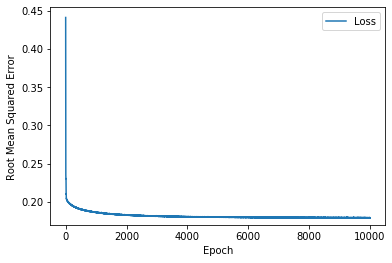

In [44]:
import tensorflow as tf

# The following variables are the hyperparameters.
learning_rate = 0.01 # originally 0.01
epochs = 10000
batch_size = 2000
validation_split = 0.2

# # Invoke the normalize feature method
# normalize_feature("ave_precip_2015", "ave_precip_2019")

# Specify the feature and the label.
# my_feature = "feature_norm"  # the total number of rooms on a specific city block.

my_label="target_2015" # the median value of a house on a specific city block.
# That is, you're going to create a model that predicts house value based 
# solely on total_rooms.  

# Discard any pre-existing version of the model.
my_model = None

# Invoke the functions.
my_model = build_model(learning_rate)
# weight, bias, epochs, rmse = train_model(my_model, train, 
#                                          my_feature, my_label,
#                                          epochs, batch_size)
weight, bias, epochs, rmse = train_model(my_model, train, my_label,
                                         epochs, batch_size)

# weight, bias, epochs, rmse = train_model(my_model, train, my_label,
#                                          epochs, batch_size, validation_split)


print("\nThe w1 learned weight for your model is %.4f" % weight[0])
print("\nThe w2 learned weight for your model is %.4f" % weight[1])
print("\nAll weights for your model are: "+ str(weight))
print("The learned bias for your model is %.4f\n" % bias )

# plot_the_model_plot(weight, bias, my_feature, my_label)
plot_the_model_plotly(weight[0], weight[1], bias, "norm_elevation", "norm_XY", my_label)
plot_the_loss_curve(epochs, rmse)

In [ ]:
def predict_target_2015(n, feature, my_label):
  """Predict the extent of flooding based on a feature."""

  batch = validate[feature].sample(n=200, random_state=1)
  predicted_values = my_model.predict_on_batch(x=batch)

  features = {name:np.array(value) for name, value in test.items()}
  label = np.array(features.pop(my_label))

  my_model.evaluate(x = features, y = label, batch_size=batch_size)

  print("feature   label          predicted          variance")
  print("  value   value          value              value")
  print("--------------------------------------")
  for i in range(n):
    print ("%5.0f %6.0f %15.0f %15.0f " % (train[feature][i],
                                   train[label][i],
                                   predicted_values[i][0],
                                   train[label][i]-predicted_values[i][0]))
    
 
# Needs to be reworked
def predict_target_2019(n, feature, label):
  """Predict the extent of flooding based on a feature."""

  # Test using the test set
  test = train.drop(columns=['target_2015'])
  print("\n: Evaluate the new model against the test set:")
  test_features = {name:np.array(value) for name, value in test.items()}

  batch = test_features
  predicted_values = my_model.predict_on_batch(x=batch)

#   print("feature   label")
#   print("  value   value")
#   print("--------------------------------------")
#   for i in range(n):
#     print ("%5.0f %6.0f" % (test['Suquare_ID'][i],
#                                    predicted_values[i][0]))
  np.savetxt("submission_linear_regression_multi_feature.csv", predicted_values, delimiter=",")

In [ ]:
#Invoke the target prediction on 10 examples:
predict_target_2015(16466, my_feature, my_label)

In [ ]:
#Invoke the target prediction on 10 examples:
predict_target_2019(16466, 'my_feature', my_label)